## Load dataset

In [ ]:
import pandas as pd
import numpy as np

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [4]:
df=pd.read_csv("data/train.csv")

In [5]:
df.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no


### Data Overview and Quality

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4250 entries, 0 to 4249
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          4250 non-null   object 
 1   account_length                 4250 non-null   int64  
 2   area_code                      4250 non-null   object 
 3   international_plan             4250 non-null   object 
 4   voice_mail_plan                4250 non-null   object 
 5   number_vmail_messages          4250 non-null   int64  
 6   total_day_minutes              4250 non-null   float64
 7   total_day_calls                4250 non-null   int64  
 8   total_day_charge               4250 non-null   float64
 9   total_eve_minutes              4250 non-null   float64
 10  total_eve_calls                4250 non-null   int64  
 11  total_eve_charge               4250 non-null   float64
 12  total_night_minutes            4250 non-null   f

In [52]:
print(df.describe())


             state  account_length    area_code  international_plan  \
count  4250.000000     4250.000000  4250.000000         4250.000000   
mean     26.094118      100.236235     0.992941            0.093176   
std      14.769049       39.698401     0.709978            0.290714   
min       0.000000        1.000000     0.000000            0.000000   
25%      14.000000       73.000000     0.000000            0.000000   
50%      26.000000      100.000000     1.000000            0.000000   
75%      39.000000      127.000000     1.000000            0.000000   
max      50.000000      243.000000     2.000000            1.000000   

       voice_mail_plan  number_vmail_messages  total_day_minutes  \
count      4250.000000            4250.000000        4250.000000   
mean          0.261647               7.631765         180.259600   
std           0.439583              13.439882          54.012373   
min           0.000000               0.000000           0.000000   
25%           0.0000

In [ ]:
### Variable distributions and correlations

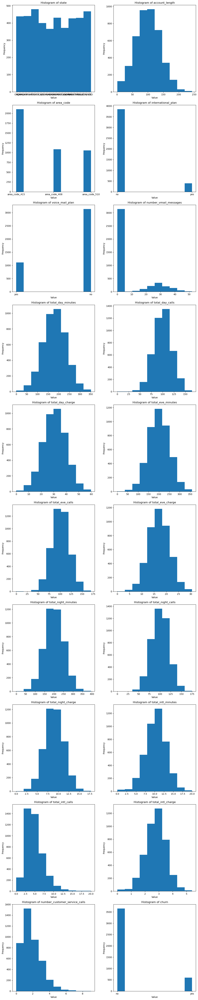

In [60]:
# Get the list of column names
columns = df.columns

# Calculate the number of rows and columns for subplots
num_rows = (len(columns) + 1) // 2  # Round up to the nearest integer
num_cols = 2

# Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 6*num_rows))


# Iterate over the columns and create histograms
for i, column in enumerate(columns):
    # Select the current subplot
    ax = axs[int(i/2), i%2]

    # Create the histogram
    ax.hist(df[column], bins=10)

    # Set labels and title for the subplot
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')
    ax.set_title(f'Histogram of {column}')

# Remove any extra subplots if the number of columns is odd
if len(columns) % 2 == 1:
    fig.delaxes(axs[-1])

# Adjust the layout and spacing
fig.tight_layout()

# Show the plot
plt.show()

#### Dependence of average call length depending on total number of calls

In [78]:
df['avg_day_call']=df['total_day_minutes']/df['total_day_calls']
df['avg_eve_call']=df['total_eve_minutes']/df['total_eve_calls']
df['avg_int_call']=df['total_intl_minutes']/df['total_intl_calls']

In [75]:
import matplotlib.patches as mpatches

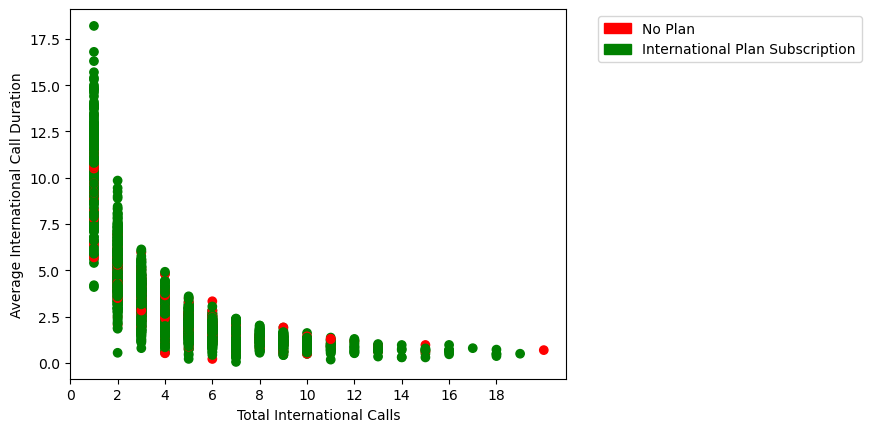

In [77]:
colors = ['red' if plan == "yes" else 'green' for plan in df['international_plan']]
plt.scatter(df['total_intl_calls'], df['avg_int_call'], c=colors)
plt.xticks(np.arange(0, 20, 2))
plt.xlabel('Total International Calls')
plt.ylabel('Average International Call Duration')

red_patch = mpatches.Patch(color='red', label='No Plan')
green_patch = mpatches.Patch(color='green', label='International Plan Subscription')
plt.legend(handles=[red_patch, green_patch], bbox_to_anchor=(1.05, 1), loc='upper left')


Text(0, 0.5, 'Average Day Call Duration')

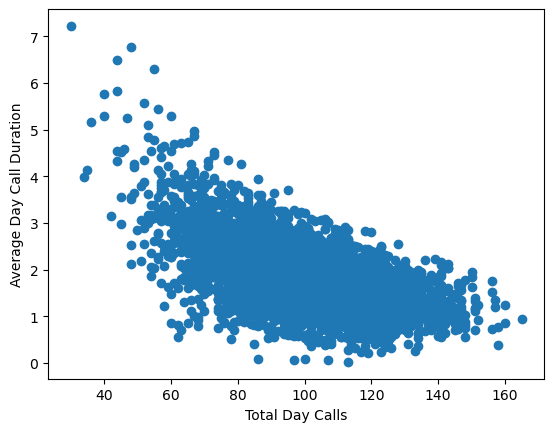

In [82]:
plt.scatter(df['total_day_calls'], df['avg_day_call'])

plt.xlabel('Total Day Calls')
plt.ylabel('Average Day Call Duration')


(0.0, 7.0)

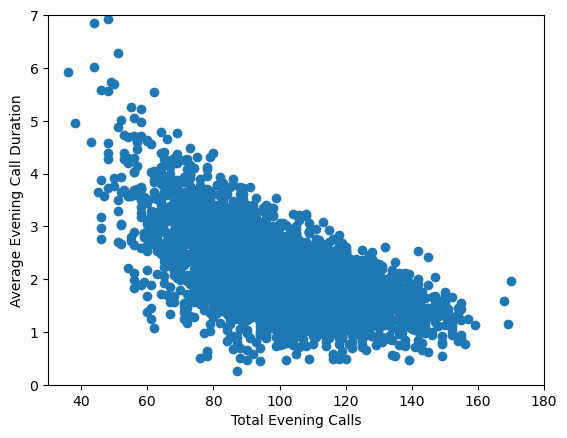

In [87]:
plt.scatter(df['total_eve_calls'], df['avg_eve_call'])

plt.xlabel('Total Evening Calls')
plt.ylabel('Average Evening Call Duration')
plt.xlim(30, 180)  # Set x-axis range
plt.ylim(0, 7)  # Set x-axis range


In [6]:
df = pd.get_dummies(df, drop_first=True)
df.columns = df.columns.str.replace('_yes', '')

### Correlation bw international plan and the # of calls and minutes

Text(0.5, 1.0, 'Distribution of total_intl_minutes by international_plan')

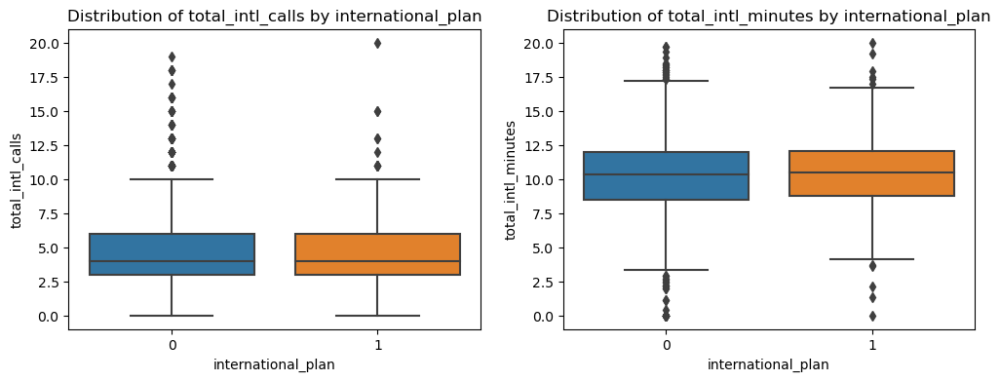

In [94]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

sns.boxplot(x='international_plan', y='total_intl_calls', data=df, ax=axs[0])
axs[0].set_title(f'Distribution of total_intl_calls by international_plan')

sns.boxplot(x='international_plan', y='total_intl_minutes', data=df, ax=axs[1])
axs[1].set_title(f'Distribution of total_intl_minutes by international_plan')

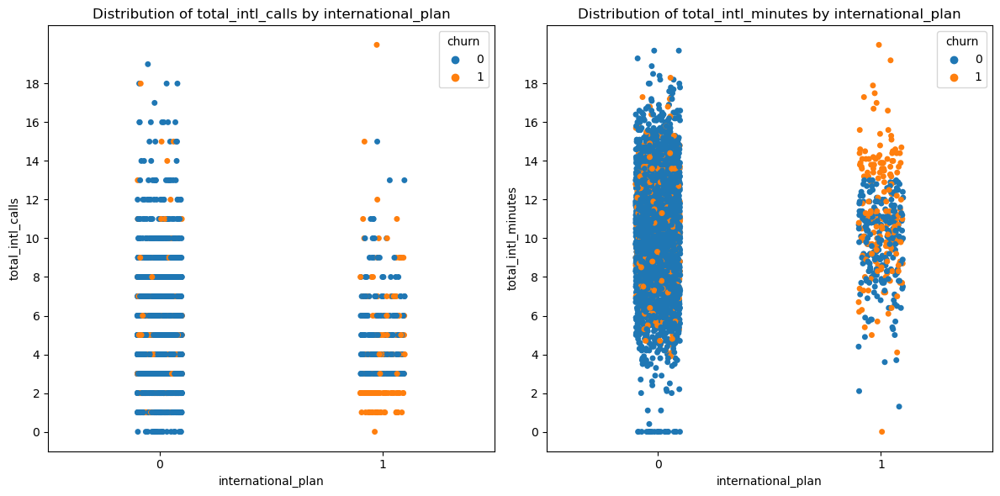

In [102]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

sns.stripplot(x='international_plan', y='total_intl_calls', hue='churn', data=df, ax=axs[0])
axs[0].set_title('Distribution of total_intl_calls by international_plan')
axs[0].set_yticks(np.arange(0, 20, 2))

sns.stripplot(x='international_plan', y='total_intl_minutes', hue='churn', data=df, ax=axs[1])
axs[1].set_title('Distribution of total_intl_minutes by international_plan')
axs[1].set_yticks(np.arange(0, 20, 2))

plt.tight_layout()  # This line is optional, it improves the layout
plt.show()

In [119]:
df.columns

Index(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn', 'avg_int_call',
       'avg_day_call', 'avg_eve_call', 'day_minutes_group',
       'evening_minutes_group', 'interaction_international_plan',
       'international_plan_group', 'number_vmail_messages_group'],
      dtype='object')

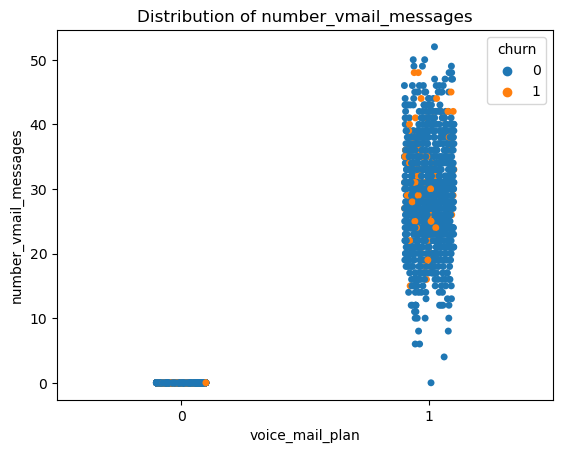

In [126]:
sns.stripplot(x='voice_mail_plan', y='number_vmail_messages', hue='churn', data=df)
plt.title('Distribution of number_vmail_messages')
plt.show()

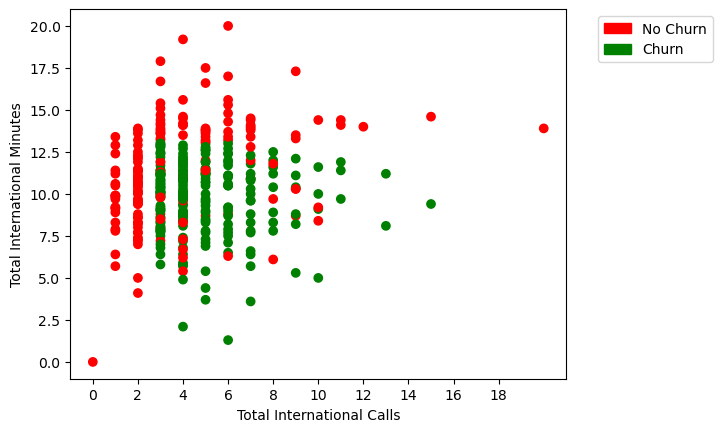

In [97]:
colors = ['red' if churn == 1 else 'green' for churn in df[df['international_plan']==1]['churn']]
plt.scatter(df[df['international_plan']==1]['total_intl_calls'], df[df['international_plan']==1]['total_intl_minutes'], c=colors)
plt.xticks(np.arange(0, 20, 2))
plt.xlabel('Total International Calls')
plt.ylabel('Total International Minutes')

red_patch = mpatches.Patch(color='red', label='No Churn')
green_patch = mpatches.Patch(color='green', label='Churn')
plt.legend(handles=[red_patch, green_patch], bbox_to_anchor=(1.05, 1), loc='upper left')


In [ ]:
# Get the list of column names
exclude_columns = ['state', 'area_code', 'international_plan', 'churn']
continuous_vars = [var for var in df.columns if var not in exclude_columns]

# Calculate the number of rows and columns for subplots
num_rows = (len(continuous_vars) + 1) // 2  # Round up to the nearest integer
num_cols = 2

# Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 6*num_rows))

# Iterate over the columns and create histograms

    sns.boxplot(x='churn', y=var, data=df, ax=axs[int(i/2), i%2])
    ax.set_title(f'Distribution of {var} by Churn')
    
# Remove any extra subplots if the number of columns is odd
if len(columns) % 2 == 1:
    fig.delaxes(axs[-1])

# Adjust the layout and spacing
fig.tight_layout()

# Show the plot
plt.show()

### Variables correlation with churn

In [494]:
from sklearn.feature_selection import mutual_info_classif

In [499]:
# Separate the features and target variable
X = df.drop('churn', axis=1)
y = df['churn']

# Calculate the mutual information
mutual_info = mutual_info_classif(X, y)
df_mutual_info = pd.DataFrame({'Feature': X.columns, 'Mutual Information': mutual_info})

# Print the mutual information scores for each feature
df_mutual_info.sort_values('Mutual Information', ascending=False)

,Feature,Mutual Information
6,total_day_minutes,0.065475
8,total_day_charge,0.064152
18,number_customer_service_calls,0.035825
3,international_plan,0.023772
15,total_intl_minutes,0.010481
17,total_intl_charge,0.010023
14,total_night_charge,0.008686
12,total_night_minutes,0.007654
16,total_intl_calls,0.006190
4,voice_mail_plan,0.006185


In [504]:
df.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,35,107,1,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
1,31,137,1,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
2,35,84,0,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
3,36,75,1,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0
4,19,121,2,0,1,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,0


In [98]:
df.columns

Index(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn', 'avg_int_call',
       'avg_day_call', 'avg_eve_call'],
      dtype='object')

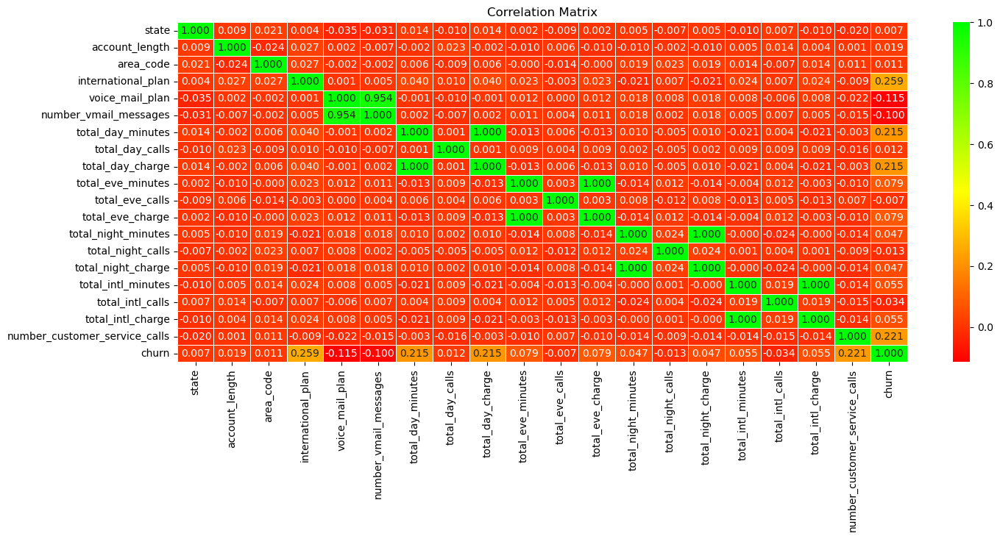

In [509]:
# Calculate the correlation matrix
from matplotlib.colors import LinearSegmentedColormap

correlation_matrix = df.corr()

# Set up the heatmap using seaborn
fig, ax = plt.subplots(figsize=(16, 6))

# Define a custom red-green-yellow color map
colors = ["#FF0000", "#FFFF00", "#00FF00"]  # Red, Yellow, Green
cmap = LinearSegmentedColormap.from_list("red-green-yellow", colors)
sns.heatmap(correlation_matrix, annot=True, cmap=cmap, fmt=".3f", linewidths=0.5, ax=ax)

# Set the title
ax.set_title("Correlation Matrix")

# Display the plot
plt.show()

In [348]:
df.corr()['churn'].sort_values(ascending=False)[1:]

international_plan               0.259053
number_customer_service_calls    0.221220
total_day_minutes                0.215272
total_day_charge                 0.215263
total_eve_minutes                0.078855
total_eve_charge                 0.078852
state_NJ                         0.056891
total_intl_minutes               0.055186
total_intl_charge                0.055177
total_night_minutes              0.046647
total_night_charge               0.046641
state_WA                         0.033577
state_MD                         0.033157
state_CA                         0.032023
state_MT                         0.028598
state_NV                         0.026023
state_OK                         0.025333
state_TX                         0.023493
state_SC                         0.020288
account_length                   0.019378
state_MS                         0.017031
state_ME                         0.016433
state_MN                         0.016356
area_code_area_code_510          0

In [510]:
df.columns

Index(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn'],
      dtype='object')

### EDA: state variable

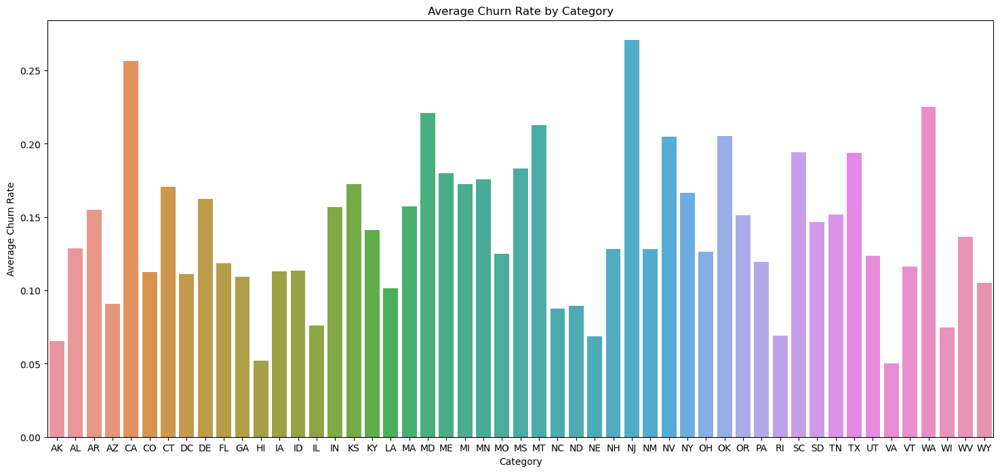

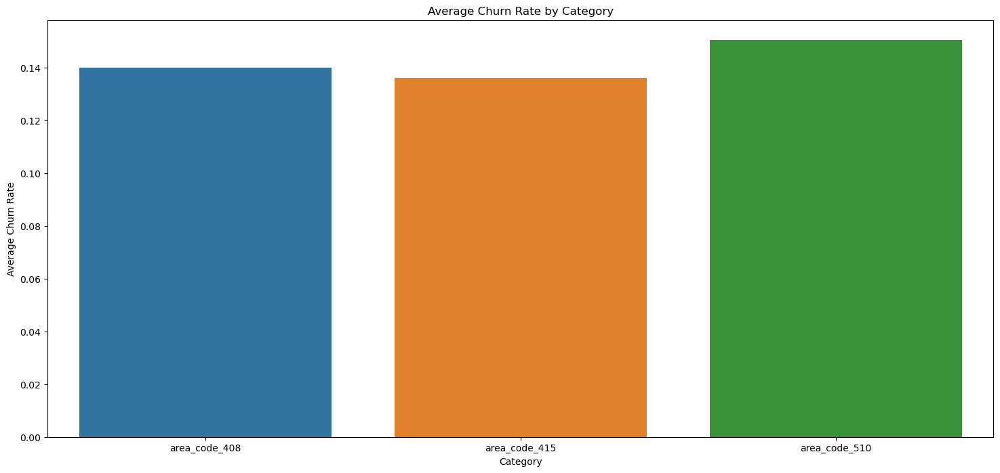

In [49]:
for var in ['state', 'area_code']:
       # Calculate average churn rate for each category
    average_churn = df.groupby(var)['churn'].mean()
    plt.figure(figsize=(18, 8))
    # Plot bar chart
    sns.barplot(x=average_churn.index, y=average_churn.values)
    plt.xlabel('Category')
    plt.ylabel('Average Churn Rate')
    plt.title('Average Churn Rate by Category')

    plt.show()

### Churn by state

In [58]:
ls "map/shp_file/ne_10m_admin_1_states_provinces_lines.shp"

 Volume in drive C is Windows
 Volume Serial Number is B45E-4058

 Directory of C:\Users\Lidia\Documents\Python Scripts\churn_prediction\map\shp_file

06/06/2023  05:12 PM    <DIR>          .
06/06/2023  05:12 PM    <DIR>          ..
05/04/2022  07:42 PM         7,363,120 ne_10m_admin_1_states_provinces_lines.shp
               1 File(s)      7,363,120 bytes
               2 Dir(s)  496,313,233,408 bytes free


In [71]:
mean_churn = df.groupby('state')['churn'].mean()

In [74]:
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns

# Load a shapefile containing state boundaries
states = gpd.read_file('map/shp_file/tl_2022_us_state.shp')  # Replace 'path/to/shapefile.shp' with the actual path to the shapefile

# Merge the state boundaries with the DataFrame containing churn data
merged_data = states.merge(mean_churn, left_on='STUSPS', right_on='state', how='left')

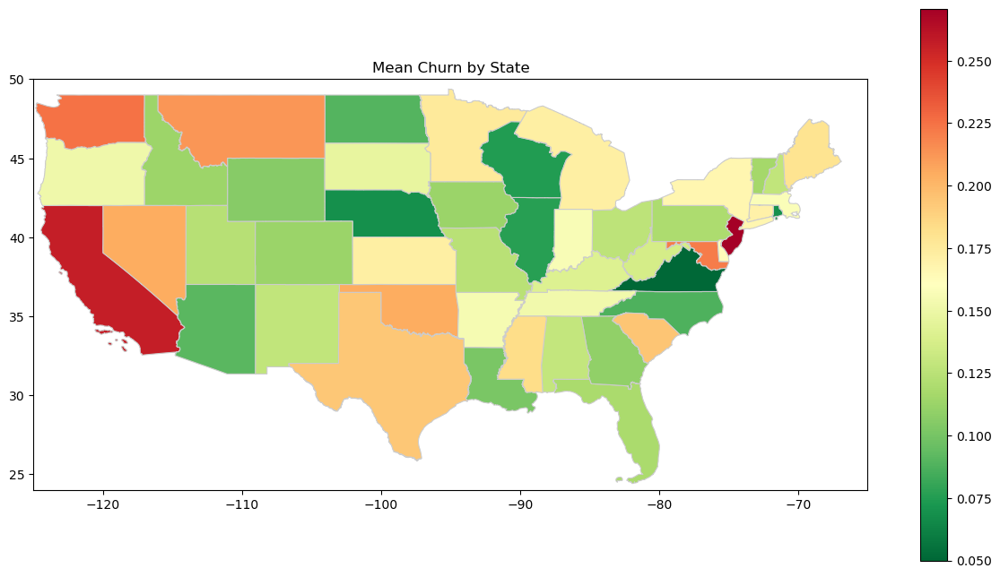

In [80]:
# Plot the map with states colored by mean churn value
fig, ax = plt.subplots(figsize=(15, 8))
merged_data.plot(column="churn", cmap='RdYlGn_r', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_title('Mean Churn by State')
ax.set_xlim([-125, -65])  # Adjust the values as needed to fit the desired area
ax.set_ylim([24, 50])  # Adjust the values as needed to fit the desired area

plt.show()

### EDA: churn by State income

In [86]:
income_data=pd.read_csv("data/us_income.csv")

In [104]:
income_data["State"] = income_data["State"].apply(str.strip)

In [84]:
# Create a dictionary mapping full state names to state codes
state_codes = {
    'Alabama': 'AL',
    'Alaska': 'AK',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'California': 'CA',
    'Colorado': 'CO',
    'Connecticut': 'CT',
    'Delaware': 'DE',
    'Florida': 'FL',
    'Georgia': 'GA',
    'Hawaii': 'HI',
    'Idaho': 'ID',
    'Illinois': 'IL',
    'Indiana': 'IN',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Louisiana': 'LA',
    'Maine': 'ME',
    'Maryland': 'MD',
    'Massachusetts': 'MA',
    'Michigan': 'MI',
    'Minnesota': 'MN',
    'Mississippi': 'MS',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New Hampshire': 'NH',
    'New Jersey': 'NJ',
    'New Mexico': 'NM',
    'New York': 'NY',
    'North Carolina': 'NC',
    'North Dakota': 'ND',
    'Ohio': 'OH',
    'Oklahoma': 'OK',
    'Oregon': 'OR',
    'Pennsylvania': 'PA',
    'Rhode Island': 'RI',
    'South Carolina': 'SC',
    'South Dakota': 'SD',
    'Tennessee': 'TN',
    'Texas': 'TX',
    'Utah': 'UT',
    'Vermont': 'VT',
    'Virginia': 'VA',
    'Washington': 'WA',
    'West Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY'
}



In [96]:
def assign_code(state):
        if state in state_codes.keys():
            return state_codes[state]
        else: return "NAN"

In [105]:

# Map full state names to state codes
income_data['State_short'] = income_data['State'].map(state_codes)

In [120]:
##add income value to merged_data
income_data['mean_churn'] = income_data['State_short'].map(mean_churn)

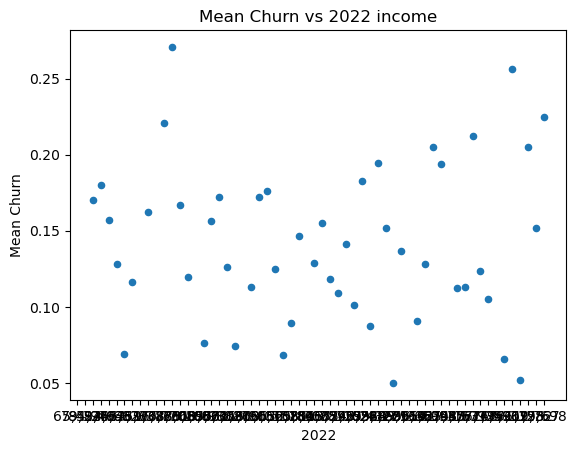

In [123]:
income_data.plot.scatter(x="2022", y="mean_churn")
plt.xlabel("2022")
plt.ylabel("Mean Churn")
plt.title("Mean Churn vs 2022 income")
plt.show()

### EDA: other categorical variables (international plan and voice mail plan)

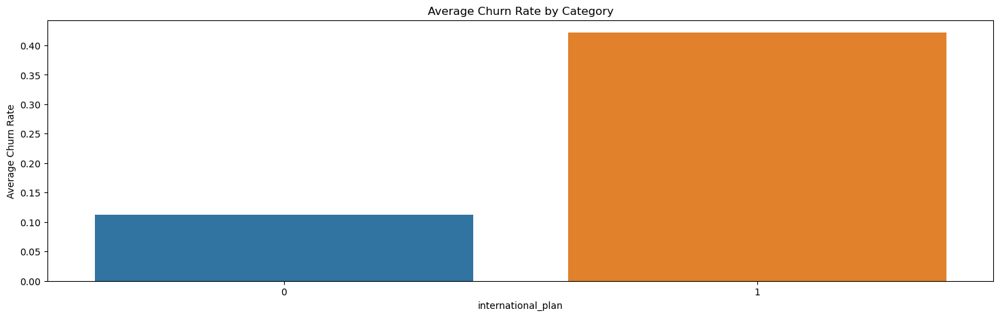

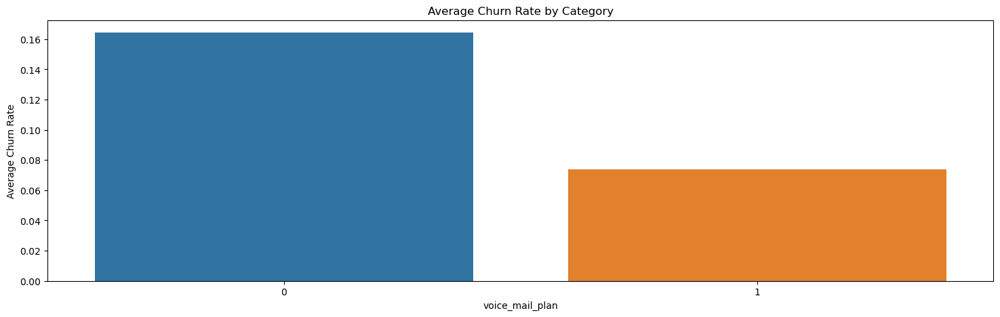

In [133]:
### Other categorical values 
for var in ['international_plan', 'voice_mail_plan']:
       # Calculate average churn rate for each category
    average_churn = df.groupby(var)['churn'].mean()
    plt.figure(figsize=(18, 5))
    # Plot bar chart
    sns.barplot(x=average_churn.index, y=average_churn.values)
    plt.xlabel(var)
    plt.ylabel('Average Churn Rate')
    plt.title('Average Churn Rate by Category')

    plt.show()


## EDA: numerical variables

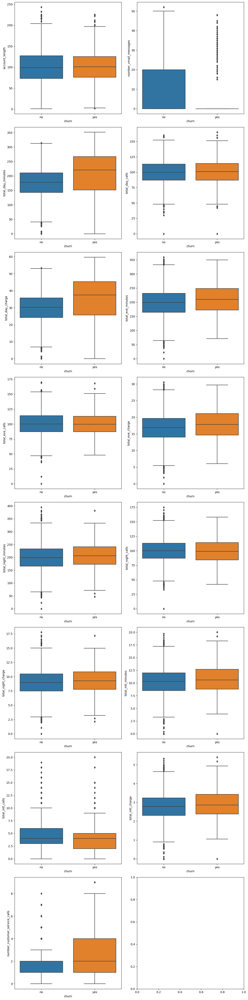

In [135]:
# Get the list of column names
exclude_columns = ['state', 'area_code', 'international_plan', 'churn',  'voice_mail_plan']
continuous_vars = [var for var in df.columns if var not in exclude_columns]

# Calculate the number of rows and columns for subplots
num_rows = (len(continuous_vars) + 1) // 2  # Round up to the nearest integer
num_cols = 2

# Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 6*num_rows))

# Iterate over the columns and create histograms
for i, var in enumerate(continuous_vars):
    sns.boxplot(x='churn', y=var, data=df, ax=axs[int(i/2), i%2])
    ax.set_title(f'Distribution of {var} by Churn')
    
# Remove any extra subplots if the number of columns is odd
if len(columns) % 2 == 1:
    fig.delaxes(axs[-1])

# Adjust the layout and spacing
fig.tight_layout()

# Show the plot
plt.show()

In [616]:
df.groupby('number_customer_service_calls')['churn'].mean()

number_customer_service_calls
0    0.109481
1    0.108924
2    0.107709
3    0.112903
4    0.440191
5    0.604938
6    0.678571
7    0.538462
8    0.500000
9    1.000000
Name: churn, dtype: float64

In [ ]:
df.groupby('number_customer_service_calls')['churn'].mean()

In [617]:
df.columns

Index(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn'],
      dtype='object')

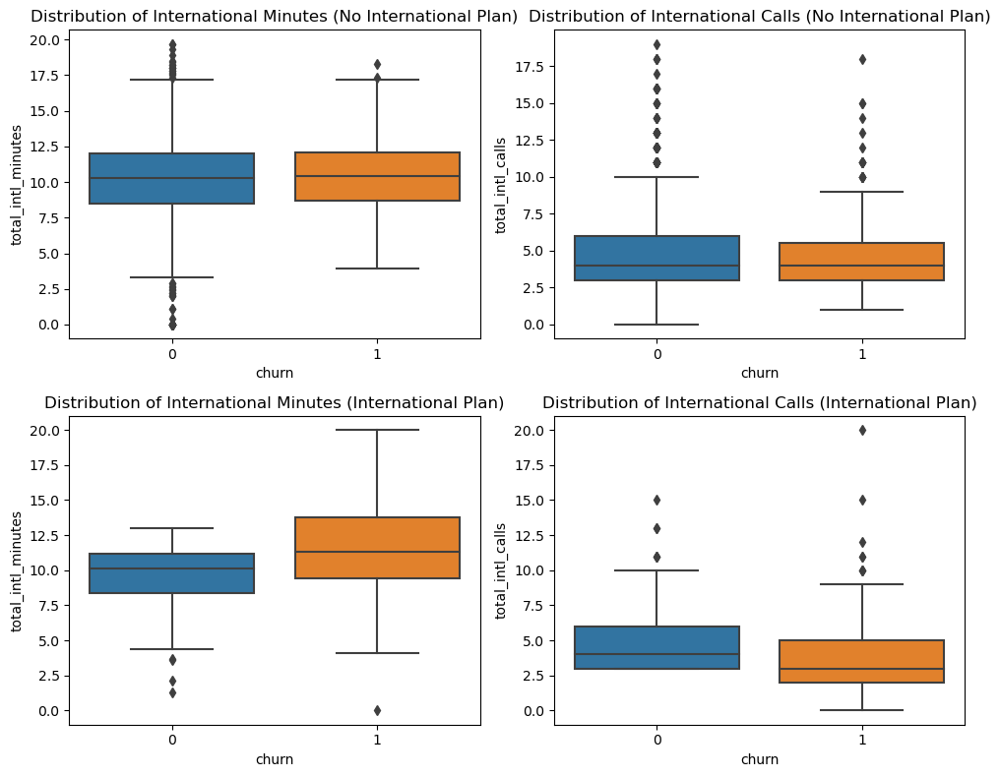

In [296]:
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# Plot 1: Distribution of total international minutes for customers without international plan and churn
sns.boxplot(x='churn', y='total_intl_minutes', data=df[df['international_plan']=='no'], ax=axes[0, 0])
axes[0, 0].set_title('Distribution of International Minutes (No International Plan)')

# Plot 2: Distribution of total international calls for customers without international plan and churn
sns.boxplot(x='churn', y='total_intl_calls', data=df[df['international_plan']=='no'], ax=axes[0, 1])
axes[0, 1].set_title('Distribution of International Calls (No International Plan)')

# Plot 3: Distribution of total international minutes for customers with international plan and churn
sns.boxplot(x='churn', y='total_intl_minutes', data=df[df['international_plan']=='yes'], ax=axes[1, 0])
axes[1, 0].set_title('Distribution of International Minutes (International Plan)')

# Plot 4: Distribution of total international calls for customers with international plan and churn
sns.boxplot(x='churn', y='total_intl_calls', data=df[df['international_plan']=='yes'], ax=axes[1, 1])
axes[1, 1].set_title('Distribution of International Calls (International Plan)')

# Adjust spacing between subplots
plt.tight_layout()

# Display the plots
plt.show()

### Charts on the variables with impact on churn

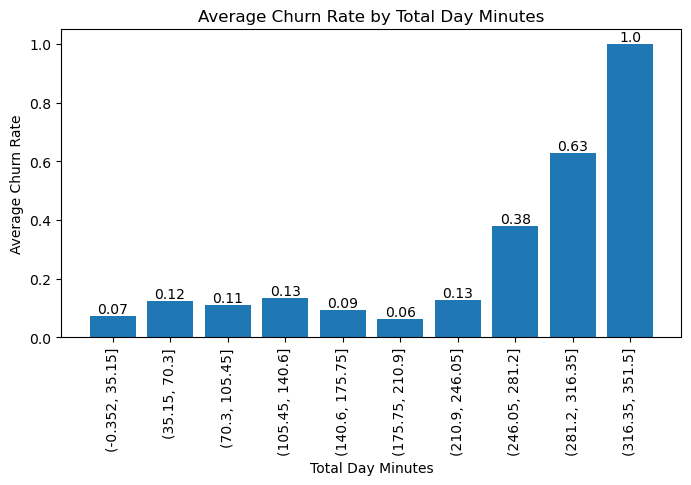

In [107]:
df['day_minutes_group'] = pd.cut(df['total_day_minutes'], bins=10)

# Calculate the average churn for each group
average_churn =df.groupby('day_minutes_group')['churn'].mean()

# Plot the histogram
plt.figure(figsize=(8, 4))
bars = plt.bar(np.arange(len(average_churn)), average_churn, tick_label=average_churn.index)
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.xlabel('Total Day Minutes')
plt.ylabel('Average Churn Rate')
plt.title('Average Churn Rate by Total Day Minutes')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.show()

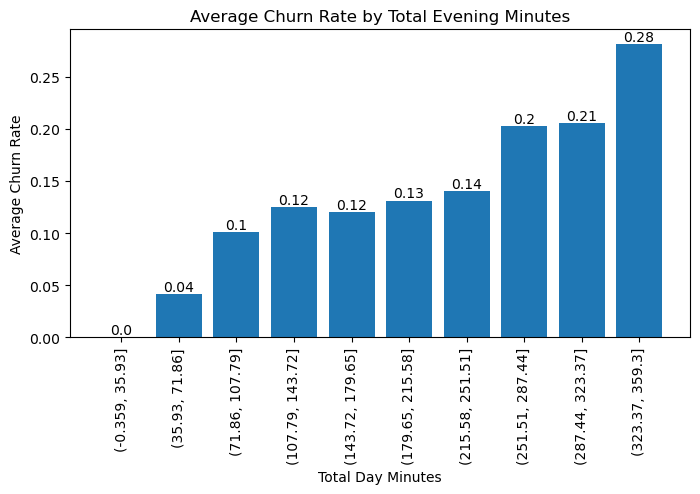

In [114]:
df['evening_minutes_group'] = pd.cut(df['total_eve_minutes'], bins=10)

# Calculate the average churn for each group
average_churn =df.groupby('evening_minutes_group')['churn'].mean()

# Plot the histogram
plt.figure(figsize=(8, 4))
bars = plt.bar(np.arange(len(average_churn)), average_churn, tick_label=average_churn.index)
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.xlabel('Total Day Minutes')
plt.ylabel('Average Churn Rate')
plt.title('Average Churn Rate by Total Evening Minutes')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.show()

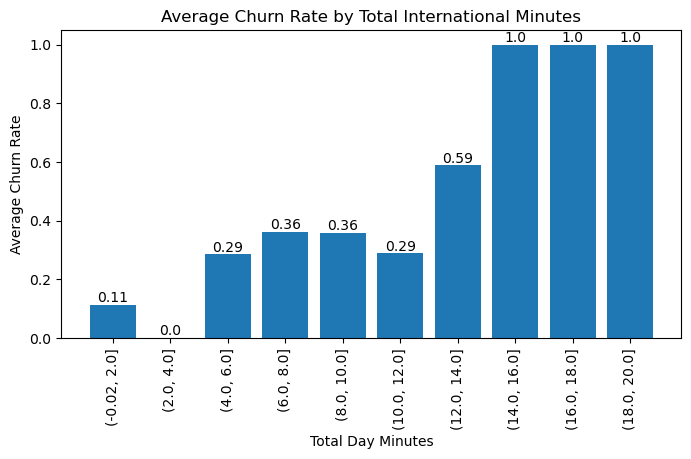

In [113]:
df['international_plan_group'] = pd.cut(df['interaction_international_plan'], bins=10)

# Calculate the average churn for each group
average_churn = df.groupby('international_plan_group')['churn'].mean()

# Plot the histogram
plt.figure(figsize=(8, 4))
bars = plt.bar(np.arange(len(average_churn)), average_churn, tick_label=average_churn.index)
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.xlabel('Total Day Minutes')
plt.ylabel('Average Churn Rate')
plt.title('Average Churn Rate by Total International Minutes')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.show()

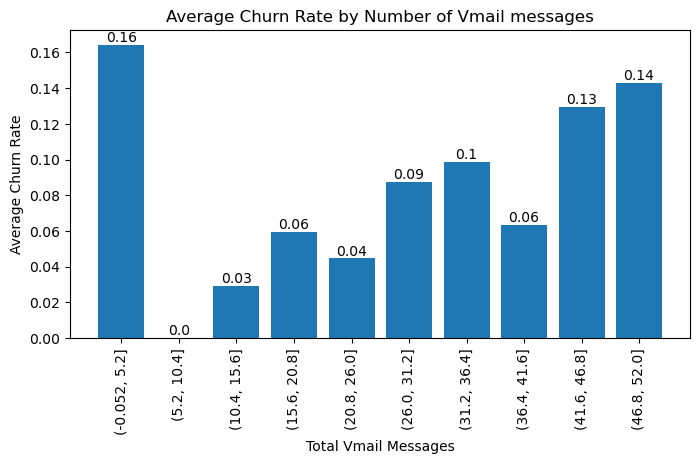

In [127]:
df['number_vmail_messages_group'] = pd.cut(df['number_vmail_messages'], bins=10)

# Calculate the average churn for each group
average_churn =df.groupby('number_vmail_messages_group')['churn'].mean()

# Plot the histogram
plt.figure(figsize=(8, 4))
bars = plt.bar(np.arange(len(average_churn)), average_churn, tick_label=average_churn.index)
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.xlabel('Total Vmail Messages')
plt.ylabel('Average Churn Rate')
plt.title('Average Churn Rate by Number of Vmail messages')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.show()

In [128]:
df.columns

Index(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn', 'avg_int_call',
       'avg_day_call', 'avg_eve_call', 'day_minutes_group',
       'evening_minutes_group', 'interaction_international_plan',
       'international_plan_group', 'number_vmail_messages_group'],
      dtype='object')

In [129]:
df.groupby('voice_mail_plan')['churn'].mean()

voice_mail_plan
0    0.164436
1    0.073741
Name: churn, dtype: float64

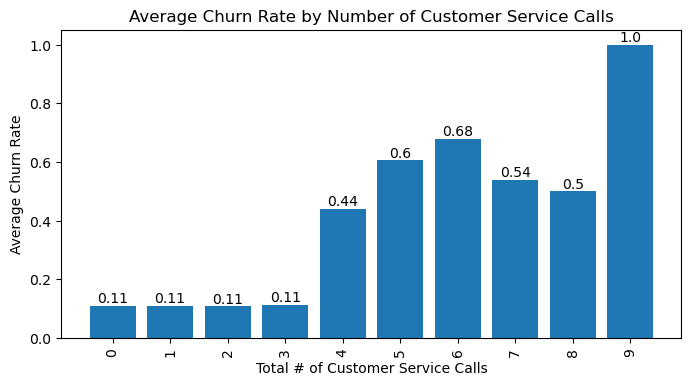

In [117]:
average_churn = df.groupby('number_customer_service_calls')['churn'].mean()

# Plot the histogram
plt.figure(figsize=(8, 4))
bars = plt.bar(np.arange(len(average_churn)), average_churn, tick_label=average_churn.index)
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.xlabel('Total # of Customer Service Calls')
plt.ylabel('Average Churn Rate')
plt.title('Average Churn Rate by Number of Customer Service Calls')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.show()

In [ ]:
### Closer look at customers who make customer service call (are they the ones on international plan, how many minutes do they use)

In [480]:
df['high_customer_service']

0       0
1       0
2       0
3       0
4       0
5       0
6       0
7       0
8       1
9       0
10      0
11      0
12      1
13      0
14      0
15      0
16      0
17      1
18      0
19      0
20      0
21      0
22      0
23      0
24      0
25      0
26      0
27      0
28      0
29      0
30      0
31      0
32      0
33      0
34      0
35      0
36      0
37      0
38      0
39      0
40      0
41      0
42      0
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      0
54      0
55      0
56      1
57      0
58      0
59      0
60      0
61      0
62      0
63      0
64      1
65      0
66      0
67      0
68      0
69      0
70      0
71      1
72      0
73      0
74      0
75      0
76      0
77      0
78      0
79      0
80      0
81      1
82      0
83      0
84      1
85      0
86      0
87      0
88      1
89      0
90      0
91      0
92      0
93      1
94      0
95      0
96      0
97      0
98      0
99      0


### Conclusions after EDA on significant variables: 

- total day minutes>246 (drastically increases churn),
- total evening minutes >250 (increases churn)
- total_intl_minutes >=13 or total_intl_calls<=2 of those on international plan (increases churn) 
- number of customer service requests >=4 (increases churn)
- interaction parameter required: international plan * total_intl_minutes (because there's impact only for only for customers with international place)


## Modelling 

### Simple model including all initial variables, for benchmark

In [7]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, confusion_matrix, f1_score


In [8]:
# Instantiate the models
logistic_regression = LogisticRegression(penalty='l1', solver='liblinear')
decision_tree = DecisionTreeClassifier()
random_forest = RandomForestClassifier()
svm = SVC()
gbm = GradientBoostingClassifier()
adaboost = AdaBoostClassifier()

# Train and evaluate the models
models = [logistic_regression, decision_tree, random_forest, svm, gbm,adaboost ]
model_names = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'SVM', "Gradient Boosting", "AdaBoost"]


In [373]:
df

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,state_AL,state_AR,state_AZ,state_CA,state_CO,state_CT,state_DC,state_DE,state_FL,state_GA,state_HI,state_IA,state_ID,state_IL,state_IN,state_KS,state_KY,state_LA,state_MA,state_MD,state_ME,state_MI,state_MN,state_MO,state_MS,state_MT,state_NC,state_ND,state_NE,state_NH,state_NJ,state_NM,state_NV,state_NY,state_OH,state_OK,state_OR,state_PA,state_RI,state_SC,state_SD,state_TN,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,area_code_area_code_415,area_code_area_code_510,international_plan,voice_mail_plan,churn
0,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
1,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,75,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
4,121,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
5,147,0,157.0,79,26.69,103.1,94,8.76,211.8,96,9.53,7.1,6,1.92,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
6,117,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,141,37,258.6,84,43.96,222.0,111,18.87,326.4,97,14.69,11.2,5,3.02,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1,0
8,65,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
9,74,0,187.7,127,31.91,163.4,148,13.89,196.0,94,8.82,9.1,5,2.46,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [9]:
subset=df.drop(df.columns[df.columns.str.contains('charge')], axis=1)

# Split the dataset into features (X) and target variable (y)
X = subset.drop('churn', axis=1)
y = subset['churn'] 

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [10]:
results=pd.DataFrame(index=['accuracy', 'precision', 'recall', 'f1-score', 'roc_auc'], columns=model_names)

In [11]:
# Train and evaluate the models

def run_models(models, model_names, X_train, y_train, X_test, y_test):
    
    for model, name in zip(models, model_names):
        # Train the model
        model.fit(X_train, y_train)

        # Make predictions on the testing set
        y_pred = model.predict(X_test)

        # Calculate evaluation metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred)

        # Calculate the confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        
        results.loc["accuracy", name]=accuracy
        results.loc["precision", name]=precision
        results.loc["recall", name]=recall
        results.loc["f1-score", name]=f1
        results.loc["roc_auc", name]=roc_auc
        print(name, cm)


In [12]:
### Feature importance

### Logistic regression coefficients
def feature_importance(logistic_regression, random_forest, gbm):
    coefficients = logistic_regression.coef_

    coefficients_df = pd.DataFrame({'Feature': X.columns, 'Coefficient': coefficients[0]})

    print(coefficients_df.sort_values("Coefficient", ascending=False))

    ## Random forest feature importance

    # Get the feature importances
    importance = random_forest.feature_importances_

    # Create a DataFrame to display the feature importances
    feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': importance})
    feature_importances = feature_importances.sort_values('Importance', ascending=False)


    print(feature_importances)

    ## GBM feature importance

    # Get the feature importances
    importance = gbm.feature_importances_

    # Create a DataFrame to display the feature importances
    feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': importance})
    feature_importances = feature_importances.sort_values('Importance', ascending=False)


    print(feature_importances)

In [377]:
run_models(models, model_names, X_train, y_train, X_test, y_test)

Logistic Regression [[704  17]
 [ 96  33]]
Decision Tree [[684  37]
 [ 38  91]]
Random Forest [[718   3]
 [ 48  81]]


C:\Users\Lidia\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


SVM [[721   0]
 [129   0]]
Gradient Boosting [[711  10]
 [ 25 104]]
AdaBoost [[694  27]
 [ 77  52]]


In [378]:
results

,Logistic Regression,Decision Tree,Random Forest,SVM,Gradient Boosting,AdaBoost
accuracy,0.867059,0.911765,0.94,0.848235,0.958824,0.877647
precision,0.66,0.710938,0.964286,0.0,0.912281,0.658228
recall,0.255814,0.705426,0.627907,0.0,0.806202,0.403101
f1-score,0.368715,0.708171,0.760563,0.0,0.855967,0.5
roc_auc,0.616118,0.827054,0.811873,0.5,0.896166,0.682826


### Feature importance

In [ ]:
### Logistic regression coefficients

In [346]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.expand_frame_repr', False)

In [379]:
coefficients = logistic_regression.coef_
coefficients_df = pd.DataFrame({'Feature': X.columns, 'Coefficient': coefficients[0]})
display(coefficients_df.sort_values("Coefficient", ascending=False))

,Feature,Coefficient
63,international_plan,2.066081
41,state_NJ,1.124975
36,state_MT,1.011285
57,state_WA,0.632110
14,state_CA,0.626426
10,number_customer_service_calls,0.539239
50,state_SC,0.414060
16,state_CT,0.403685
29,state_MA,0.386831
32,state_MI,0.320520


#### Random forest feature importance

In [381]:
# Get the feature importances
importance = random_forest.feature_importances_

# Create a DataFrame to display the feature importances
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': importance})
feature_importances = feature_importances.sort_values('Importance', ascending=False)


print(feature_importances)

                          Feature  Importance
2               total_day_minutes    0.223851
10  number_customer_service_calls    0.106086
4               total_eve_minutes    0.083041
63             international_plan    0.065168
8              total_intl_minutes    0.063331
6             total_night_minutes    0.058323
9                total_intl_calls    0.053310
0                  account_length    0.045816
7               total_night_calls    0.045798
3                 total_day_calls    0.045518
5                 total_eve_calls    0.044481
1           number_vmail_messages    0.021931
64                voice_mail_plan    0.016482
61        area_code_area_code_415    0.008950
62        area_code_area_code_510    0.007717
41                       state_NJ    0.006589
36                       state_MT    0.003976
57                       state_WA    0.003649
30                       state_MD    0.003613
16                       state_CT    0.003555
59                       state_WV 

#### GBM feature importance

In [382]:
# Get the feature importances
importance = gbm.feature_importances_

# Create a DataFrame to display the feature importances
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': importance})
feature_importances = feature_importances.sort_values('Importance', ascending=False)


print(feature_importances)

                          Feature    Importance
2               total_day_minutes  3.189335e-01
10  number_customer_service_calls  1.509216e-01
4               total_eve_minutes  1.375268e-01
8              total_intl_minutes  1.001843e-01
9                total_intl_calls  8.298323e-02
63             international_plan  8.100982e-02
1           number_vmail_messages  5.309543e-02
64                voice_mail_plan  3.040421e-02
6             total_night_minutes  1.923029e-02
7               total_night_calls  6.151625e-03
3                 total_day_calls  3.074583e-03
43                       state_NV  2.620529e-03
0                  account_length  2.507391e-03
5                 total_eve_calls  2.014428e-03
41                       state_NJ  2.010967e-03
31                       state_ME  1.157879e-03
35                       state_MS  7.255811e-04
30                       state_MD  6.765877e-04
15                       state_CO  6.518359e-04
27                       state_KY  6.498

In [298]:
len(X.columns)

19

In [299]:
len(importance)

19

### Model after feature engineering

In [13]:
df['interaction_international_minutes'] = df["international_plan"] * df['total_intl_minutes']
df['interaction_international_calls'] = df["international_plan"] * df['total_intl_calls']

In [14]:
subset=df.drop(df.columns[df.columns.str.contains('charge')], axis=1)
subset=subset.drop(df.columns[df.columns.str.contains('area_code')], axis=1)
subset=subset.drop(df.columns[df.columns.str.contains('state')], axis=1)
subset=subset.drop(['total_intl_minutes', 'total_intl_calls', 'voice_mail_plan'], axis=1)

In [15]:
# Split the dataset into features (X) and target variable (y)
X = subset.drop('churn', axis=1)
y = subset['churn'] 

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [518]:
     
run_models(models, model_names, X_train, y_train, X_test, y_test)

Logistic Regression [[704  17]
 [ 93  36]]
Decision Tree [[685  36]
 [ 32  97]]
Random Forest [[716   5]
 [ 33  96]]
SVM [[721   0]
 [123   6]]
Gradient Boosting [[711  10]
 [ 25 104]]
AdaBoost [[700  21]
 [ 64  65]]


In [519]:
results

,Logistic Regression,Decision Tree,Random Forest,SVM,Gradient Boosting,AdaBoost
accuracy,0.870588,0.92,0.955294,0.855294,0.958824,0.9
precision,0.679245,0.729323,0.950495,1.0,0.912281,0.755814
recall,0.27907,0.751938,0.744186,0.046512,0.806202,0.503876
f1-score,0.395604,0.740458,0.834783,0.088889,0.855967,0.604651
roc_auc,0.627746,0.851004,0.868626,0.523256,0.896166,0.737375


In [515]:
feature_importance(logistic_regression, random_forest, gbm)

                              Feature  Coefficient
8       number_customer_service_calls     0.549471
12  interaction_international_minutes     0.346908
10            area_code_area_code_510     0.093011
9             area_code_area_code_415     0.027815
2                   total_day_minutes     0.013976
4                   total_eve_minutes     0.005764
6                 total_night_minutes     0.003710
0                      account_length     0.001261
3                     total_day_calls     0.000766
11                 international_plan     0.000000
5                     total_eve_calls    -0.001994
7                   total_night_calls    -0.003295
1               number_vmail_messages    -0.035766
13    interaction_international_calls    -0.380695
                              Feature  Importance
2                   total_day_minutes    0.267796
8       number_customer_service_calls    0.122739
4                   total_eve_minutes    0.104179
13    interaction_international_cal

## Handling Class Imbalance

In [58]:
subset['churn'].mean()

0.14070588235294118

In [16]:
from imblearn.over_sampling import SMOTE

In [17]:
# Create an instance of the SMOTE oversampler
smote = SMOTE()
# Apply SMOTE to oversample the minority class
X_resampled, y_resampled = smote.fit_resample(X, y)

In [18]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

In [26]:
run_models(models, model_names, X_train, y_train, X_test, y_test)

Logistic Regression [[620 138]
 [169 534]]
Decision Tree [[690  68]
 [ 52 651]]
Random Forest [[741  17]
 [ 50 653]]
SVM [[695  63]
 [306 397]]
Gradient Boosting [[723  35]
 [ 94 609]]
AdaBoost [[691  67]
 [136 567]]


In [405]:
44/703

0.06258890469416785

In [523]:
results

,Logistic Regression,Decision Tree,Random Forest,SVM,Gradient Boosting,AdaBoost
accuracy,0.793977,0.906913,0.945243,0.7577,0.914442,0.865845
precision,0.801802,0.896503,0.974125,0.852525,0.957278,0.893023
recall,0.759602,0.911807,0.910384,0.600284,0.860597,0.819346
f1-score,0.780131,0.90409,0.941176,0.704508,0.906367,0.854599
roc_auc,0.79273,0.907091,0.943978,0.751989,0.912489,0.864158


### Logistic regression feature engineering

In [447]:
df.columns

Index(['account_length', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'state_AL', 'state_AR', 'state_AZ',
       'state_CA', 'state_CO', 'state_CT', 'state_DC', 'state_DE', 'state_FL',
       'state_GA', 'state_HI', 'state_IA', 'state_ID', 'state_IL', 'state_IN',
       'state_KS', 'state_KY', 'state_LA', 'state_MA', 'state_MD', 'state_ME',
       'state_MI', 'state_MN', 'state_MO', 'state_MS', 'state_MT', 'state_NC',
       'state_ND', 'state_NE', 'state_NH', 'state_NJ', 'state_NM', 'state_NV',
       'state_NY', 'state_OH', 'state_OK', 'state_OR', 'state_PA', 'state_RI',
       'state_SC', 'state_SD', 'state_TN', 'state_TX', 'state_UT', 'state_VA',
       'state_VT', 'state_WA', 'state_WI', '

In [525]:
df['high_minutes'] = (df['total_day_minutes'] > 246).astype(int)
df['high_eve_minutes'] = (df['total_eve_minutes'] > 250).astype(int)
df['high_int_minutes'] = ((df['total_intl_minutes'] > 13)& (df['international_plan'] == 1)).astype(int)
df['low_int_calls'] = ((df['total_intl_calls'] <= 2) & (df['international_plan'] == 1)).astype(int)
df['high_customer_service'] = (df['number_customer_service_calls'] >=4).astype(int)

In [526]:
subset=df.drop(df.columns[df.columns.str.contains('charge')], axis=1)
subset=subset.drop(df.columns[df.columns.str.contains('state')], axis=1)

In [527]:
subset=df.drop(df.columns[df.columns.str.contains('charge')], axis=1)

In [528]:
subset=subset.drop(df.columns[df.columns.str.contains('state')], axis=1)

In [529]:
subset=subset.drop(df.columns[df.columns.str.contains('area_code')], axis=1)

In [530]:
subset=subset.drop(['total_intl_minutes', 'total_intl_calls'], axis=1)

In [531]:
subset.head()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_eve_minutes,total_eve_calls,total_night_minutes,total_night_calls,number_customer_service_calls,international_plan,voice_mail_plan,churn,interaction_international_minutes,interaction_international_calls,high_minutes,high_eve_minutes,high_int_minutes,low_int_calls,high_customer_service
0,107,26,161.6,123,195.5,103,254.4,103,1,0,1,0,0.0,0,0,0,0,0,0
1,137,0,243.4,114,121.2,110,162.6,104,0,0,0,0,0.0,0,0,0,0,0,0
2,84,0,299.4,71,61.9,88,196.9,89,2,1,0,0,6.6,7,1,0,0,0,0
3,75,0,166.7,113,148.3,122,186.9,121,3,1,0,0,10.1,3,0,0,0,0,0
4,121,24,218.2,88,348.5,108,212.6,118,3,0,1,0,0.0,0,0,1,0,0,0


In [532]:
X=subset.drop("churn", axis=1)
y=subset['churn']

In [533]:
# Create an instance of the SMOTE oversampler
smote = SMOTE()
# Apply SMOTE to oversample the minority class
X_resampled, y_resampled = smote.fit_resample(X, y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

In [534]:
model=logistic_regression

In [535]:
model.fit(X_train, y_train)
    
# Make predictions on the testing set
y_pred = model.predict(X_test)

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)
 # Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print the results

print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'ROC AUC: {roc_auc}')
print(f'F1-score: {f1}')
print('Confusion Matrix:')
print(cm)
print('----------------------------------')

Accuracy: 0.8480492813141683
Precision: 0.8811410459587956
Recall: 0.7908961593172119
ROC AUC: 0.8459757841440941
F1-score: 0.833583208395802
Confusion Matrix:
[[683  75]
 [147 556]]
----------------------------------


In [536]:
coefficients = model.coef_

coefficients_df = pd.DataFrame({'Feature': X.columns, 'Coefficient': coefficients[0]})

print(coefficients_df.sort_values("Coefficient", ascending=False))

                              Feature  Coefficient
16                      low_int_calls     8.506286
15                   high_int_minutes     3.874557
13                       high_minutes     2.151067
17              high_customer_service     1.825742
11  interaction_international_minutes     0.998105
14                   high_eve_minutes     0.342898
8       number_customer_service_calls     0.299840
1               number_vmail_messages     0.130291
4                   total_eve_minutes     0.006261
2                   total_day_minutes     0.006113
6                 total_night_minutes     0.004609
0                      account_length     0.002586
3                     total_day_calls     0.000192
7                   total_night_calls    -0.002562
5                     total_eve_calls    -0.003840
12    interaction_international_calls    -0.214299
10                    voice_mail_plan    -6.112111
9                  international_plan    -8.944776


### Grid search

In [236]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score

In [237]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

In [406]:
rf_param_grid = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [5, 10, 25, 50],
    'min_samples_split': [2, 5, 10]
}

# Perform grid search with cross-validation
rf_grid = GridSearchCV(estimator=random_forest, param_grid=rf_param_grid, cv=5, scoring="recall")
rf_grid.fit(X, y)

# Get the best Random Forest model from grid search
rf_best_model = rf_grid.best_estimator_

In [408]:
# Define the hyperparameter grid for Decision Tree
dt_param_grid = {
    'max_depth': [5, 10, 25, 50],
    'min_samples_split': [2, 5, 10]
}

# Perform grid search with cross-validation
dt_grid = GridSearchCV(estimator=decision_tree, param_grid=dt_param_grid, cv=5, scoring="recall")
dt_grid.fit(X, y)

# Get the best Decision Tree model from grid search
dt_best_model = dt_grid.best_estimator_

In [409]:
for model, name in zip([dt_best_model, rf_best_model], model_names[1:3]):
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions on the testing set
    y_pred = model.predict(X_test)
    
    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)
     # Calculate the confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    
    # Print the results
    print(f'{name}:')
    print(f'Accuracy: {accuracy}')
    print(f'Precision: {precision}')
    print(f'Recall: {recall}')
    print(f'ROC AUC: {roc_auc}')
    print(f'F1-score: {f1}')
    print('Confusion Matrix:')
    print(cm)
    print('----------------------------------')

Decision Tree:
Accuracy: 0.917864476386037
Precision: 0.9020689655172414
Recall: 0.930298719772404
ROC AUC: 0.9183155867991307
F1-score: 0.9159663865546219
Confusion Matrix:
[[687  71]
 [ 49 654]]
----------------------------------
Random Forest:
Accuracy: 0.9500342231348392
Precision: 0.9632352941176471
Recall: 0.9317211948790897
ROC AUC: 0.9493698322680411
F1-score: 0.9472161966738973
Confusion Matrix:
[[733  25]
 [ 48 655]]
----------------------------------


In [407]:
print(rf_best_model.get_params()['max_depth'], rf_best_model.get_params()['n_estimators'], rf_best_model.get_params()['min_samples_split'])

25 400 5


In [261]:
print(dt_grid.best_estimator_.get_params()['max_depth'], dt_grid.best_estimator_.get_params()['min_samples_split'])

10 10


### Visualize decision tree for a simplified decision tree model

In [422]:
simple_dt_model = DecisionTreeClassifier(max_depth=3)

# Train the model
simple_dt_model.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = simple_dt_model.predict(X_test)

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

# Print the results
print(f'{name}:')
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'ROC AUC: {roc_auc}')
print(f'F1-score: {f1}')
print('Confusion Matrix:')
print(cm)
print('----------------------------------')
       

Random Forest:
Accuracy: 0.9105882352941177
Precision: 0.8840579710144928
Recall: 0.4728682170542636
ROC AUC: 0.7308862583190874
F1-score: 0.6161616161616161
Confusion Matrix:
[[733  25]
 [ 48 655]]
----------------------------------


In [423]:
from sklearn import tree

In [424]:
import graphviz

In [425]:
# Plot the decision tree
dot_data = tree.export_graphviz(simple_dt_model, 
               feature_names=X.columns,  
               class_names=['yes', 'no'],
               filled=True)

In [426]:
graph = graphviz.Source(dot_data, format="png") 

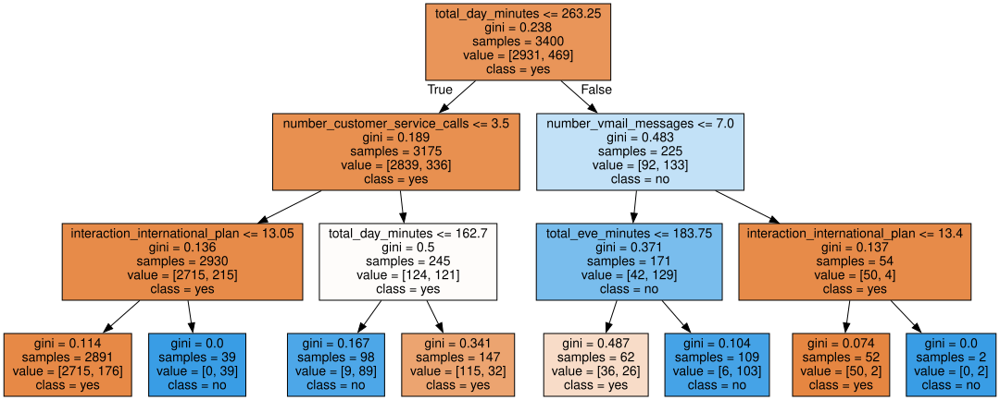

In [427]:
graph

In [493]:
df[df.columns.str]

Index(['account_length', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'state_AL', 'state_AR', 'state_AZ',
       'state_CA', 'state_CO', 'state_CT', 'state_DC', 'state_DE', 'state_FL',
       'state_GA', 'state_HI', 'state_IA', 'state_ID', 'state_IL', 'state_IN',
       'state_KS', 'state_KY', 'state_LA', 'state_MA', 'state_MD', 'state_ME',
       'state_MI', 'state_MN', 'state_MO', 'state_MS', 'state_MT', 'state_NC',
       'state_ND', 'state_NE', 'state_NH', 'state_NJ', 'state_NM', 'state_NV',
       'state_NY', 'state_OH', 'state_OK', 'state_OR', 'state_PA', 'state_RI',
       'state_SC', 'state_SD', 'state_TN', 'state_TX', 'state_UT', 'state_VA',
       'state_VT', 'state_WA', 'state_WI', '

In [496]:
df['total_charge']=df[df.columns[df.columns.str.contains('charge')]].sum(axis=1)

In [497]:
df['total_charge']

0       59.24
1       62.29
2       66.80
3       52.09
4       78.31
5       46.90
6       73.32
7       80.54
8       54.20
9       57.08
10      40.19
11      59.64
12      92.29
13      65.02
14      60.50
15      63.90
16      59.00
17      36.02
18      48.06
19      41.05
20      48.08
21      63.24
22      44.61
23      64.12
24      49.60
25      69.43
26      79.68
27      58.49
28      48.42
29      54.20
30      58.03
31      46.64
32      56.20
33      61.93
34      39.15
35      58.26
36      48.30
37      59.36
38      56.13
39      47.25
40      68.32
41      68.49
42      63.62
43      62.76
44      65.94
45      45.37
46      49.85
47      65.82
48      57.68
49      71.42
50      62.03
51      45.51
52      50.89
53      70.46
54      46.88
55      63.43
56      55.20
57      72.08
58      68.96
59      64.84
60      62.68
61      65.16
62      55.50
63      81.75
64      27.02
65      60.57
66      56.46
67      73.63
68      69.96
69      77.16
70      66.54
71    

In [498]:
df.groupby("churn")['total_charge'].mean()

churn
0    58.457840
1    65.532174
Name: total_charge, dtype: float64

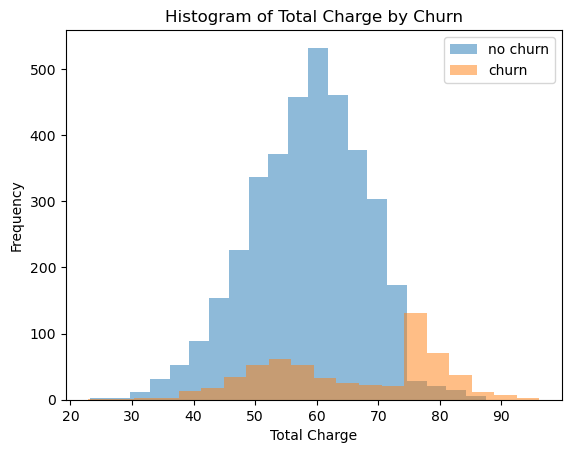

In [500]:
# Filter data for churn=0 and churn=1
churn_0 = df[df['churn'] == 0]
churn_1 = df[df['churn'] == 1]

# Plot the histograms
plt.hist(churn_0['total_charge'], bins=20, alpha=0.5, label='no churn')
plt.hist(churn_1['total_charge'], bins=20, alpha=0.5, label='churn')

# Add labels and title
plt.xlabel('Total Charge')
plt.ylabel('Frequency')
plt.title('Histogram of Total Charge by Churn')
plt.legend()

# Show the plot
plt.show()

In [ ]:
# Filter data for churn=0 and churn=1
churn_0 = df[df['churn'] == 0]
churn_1 = df[df['churn'] == 1]

# Plot the histograms
plt.hist(churn_0['total_charge'], bins=20, alpha=0.5, label='no churn')
plt.hist(churn_1['total_charge'], bins=20, alpha=0.5, label='churn')

# Add labels and title
plt.xlabel('Total Charge')
plt.ylabel('Frequency')
plt.title('Histogram of Total Charge by Churn')
plt.legend()

# Show the plot
plt.show()

In [501]:
df.columns[df.columns.str.contains('charge')]

Index(['total_day_charge', 'total_eve_charge', 'total_night_charge',
       'total_intl_charge', 'total_charge'],
      dtype='object')

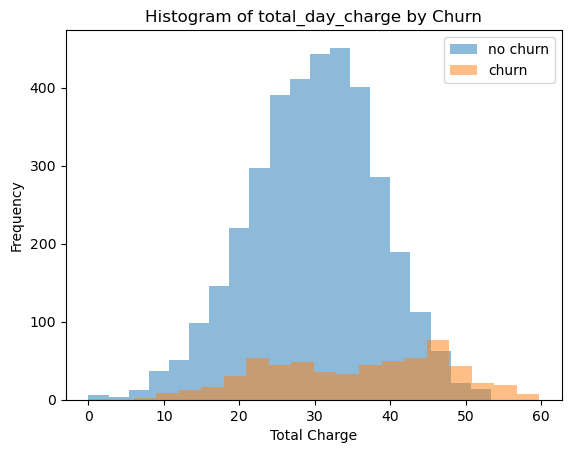

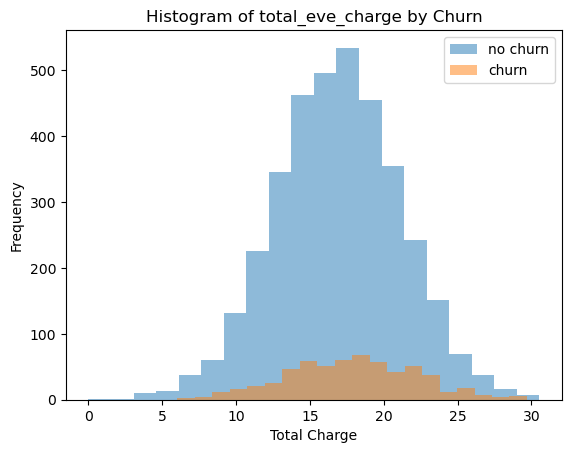

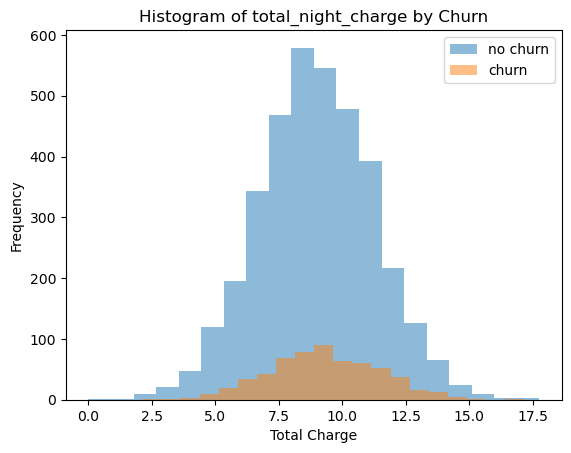

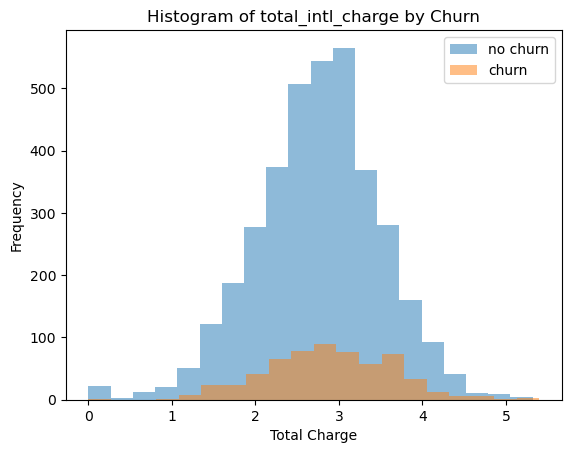

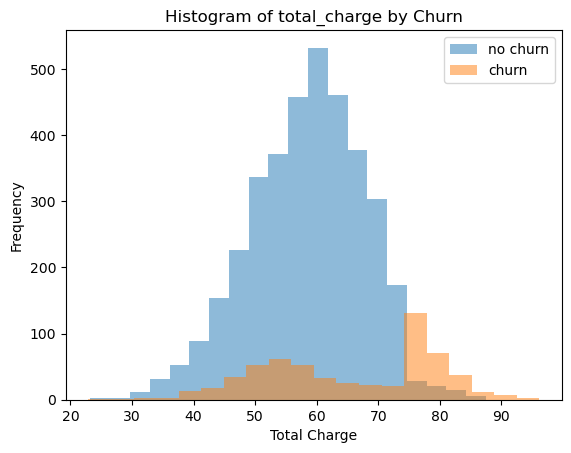

In [504]:
churn_0 = df[df['churn'] == 0]
churn_1 = df[df['churn'] == 1]

for x_charge in ['total_day_charge', 'total_eve_charge', 'total_night_charge',
       'total_intl_charge', 'total_charge']:
        # Plot the histograms
    plt.hist(churn_0[x_charge], bins=20, alpha=0.5, label='no churn')
    plt.hist(churn_1[x_charge], bins=20, alpha=0.5, label='churn')

    # Add labels and title
    plt.xlabel('Total Charge')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {x_charge} by Churn')
    plt.legend()

    # Show the plot
    plt.show()
    